# Introduksjon

I denne Notebooken ser vi på hvordan Python kan brukes til å lage lyd! Det er mange eksempler på at programmering har blitt brukt til å lage lyd og musikk; bak mange av låtene du hører på radio eller på nett befinner det seg et digitalt, programmert instrument. Her får du en smakebit på hvordan man lager lyd digitalt. I tillegg kan eksemplene brukes til å vise hvordan fenomener kjent fra matematikken *høres ut*. Bølgeformer, støy, harmoniske rekker, forhold mellom frekvenser og modulasjoner er alle *hørbare* fenomener, og her kan du eksperimentere med hvordan de høres ut!

Notebooken er krydret med litt enkel musikkteori der det har passet seg for å kort nevne hva de matematiske og lydlige fenomenene heter i musikkverden. Forhåpentligvis vil det gi folk med realfagsbakgrunn et glimt inn i musikkens verden, og musikkentusiaster en grunn til å fatte interesse for matematikken bak lyden de har glede av. Samtidig er det absolutt ikke er nødvendig med musikkunnskaper for å kunne bruke Notebooken.

Del 2 til 7 er i hovedsak musikkorientert og egner seg både for ungdomstrinnet og videregående. Man velger selv hvor mye av matematikken man vil forklare, det er uansett mulig å lage lyd med koden uten å forstå matematikken bak. Disse delene bygger naturlig på hverandre, særlig i sekvensen fra tone, til melodi til flerstemthet.

Del 8 til 10 er mer matematisk orientert og egner seg gjerne best på videregående nivå. 

En del av kodelinjene i cellene plotter de visuelle grafene, det er ikke nødvendig å verken lese eller forstå hvordan disse kodelinjene fungerer.

## Setup

Mye av koden er avhengig av funksjonsdefinisjoner fra tidligere avsnitt. For enkelhetsskyld har vi derfor laget en egen modul `setup` hvor alle nødvendige variabler og funksjoner er definert. **For å kjøre koden i hver notebook trenger du altså å evaluere kun denne ene cellen.** De som er spesielt interessert kan ta en kikk på koden i filen `setup.py`.

In [1]:
# Denne cellen er i starten av hver notebook.
# Evaluer denne først

from startscript import *

# Brukes for plottingen
%matplotlib inline

## Anbefalte forkunnskaper

For hele Notebooken trengs grunnleggende mattekunnskaper. I tillegg antas det at man kjenner til det grunnleggende i Python:

- Variabler
- Aritmetiske operasjoner (`+`, `-`, `/`, `*`, `%`)
- Litt om løkker (`for`, `while`)
- Litt om funksjoner: definisjon og bruk av dem
- Litt om betingelser (`if` – `elif` – `else`)
- Kjennskap til arrays/lister

I deler av Notebooken er det en fordel, men ikke nødvendig, med kjennskap til enkel vektor-regning siden koden benytter seg mye av arrays/lister fra Python-pakken `numpy`. Man kan allikevel og uten problemer eksperimentere og leke med eksemplene selv om man ikke har denne forkunnskapen.

# Oppstart

Når vi skal spille av lyd må angi det som heter *samplerate*. Merk at vi setter sampleraten `rate` til 48000Hz. Sampleraten er antall målepunkter eller amplitude-verdier for lydsignalet hvert sekund. Sampleraten må være minst dobbelt så stor som den høyeste frekvensen vi vil spille av. Siden menneskeøret kan oppfatte frekvenser omtrent i rekkevidden 20-20000Hz (med store variasjoner mellom personer!) har vi valgt en samplerate som lar oss produsere de høyeste frekvensene med god margin: $ 48000 > 20000 \cdot 2 $

In [2]:
# Evaluer denne cellen først.

from numpy import *
from scipy import signal
from numpy.random import rand
from IPython.display import Audio, display
from matplotlib.pyplot import *
from ipywidgets import interact
%matplotlib inline

rate = 48000.0

# En hjelpefunksjon for avspilling av lydsignalene
def spill_av(lydsignal, rate=48000.0):
    display(Audio(lydsignal, rate=rate, autoplay=True))

<div class="alert alert-block alert-warning"><b>Pass på hørselen!</b> Av hensyn til hørselen frarådes bruk av hodetelefoner. Pass også på at volumet på maskinen/enheten ikke er for høyt når du spiller av lydeksemplene eller tester ut ting selv.</div>

Vi kan teste at vi har lyd med å spille av en lokalt lagret lydfil. Pass på at du har lastet ned hele mappen med Notebookene og lydfiler. Hvis mappen med lydfiler mangler kommer en feilmelding. Be i så fall kursleder om å få lydfilen og hjelp til hvor den skal lagres.

In [3]:
# Evaluer denne cellen

lydfil = "./lydfiler/lydEksempel_klokke.wav"  # Må være tilgjengelig på maskinen din
spill_av(lydfil)

In [4]:
# og denne cellen

lydfil = "./lydfiler/lydEksempel_Stabilia.wav"  # Må være tilgjengelig på maskinen din
spill_av(lydfil)

In [5]:
# og denne

lydfil = "./lydfiler/lydEksempel_støyOgRomklang.wav"  # Må være tilgjengelig på maskinen din
spill_av(lydfil)

# Noen smakebiter

Under er noen smakebiter på hva du finner i de andre delene i Notebooken. Evaluer cellene og se og hør hva som skjer!

In [6]:
# Evaluer først denne, slik at de andre cellene kan kjøres

from startscript import *

%matplotlib inline

## En tone

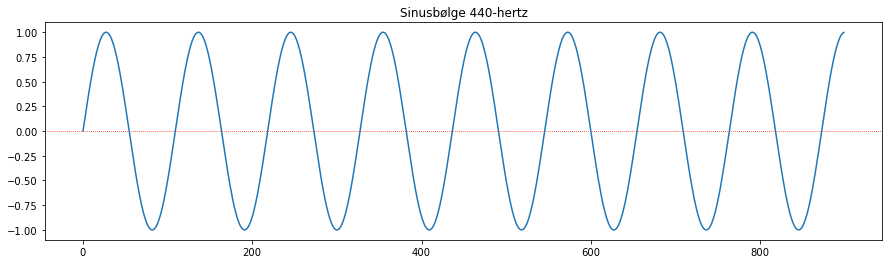

In [7]:
# Evaluer cellen - Sinusbølge
sinusbølge = sinus_generator(440, 2, 1)
spill_av(sinusbølge)


# ------------------------------------------------------------
# Kode for å plotte graf
x = arange(0, 900)
figure().set_figwidth(15)
title("Sinusbølge 440-hertz")
axline((0,0), (1,0), linewidth=0.75, color='r', linestyle=":")
plot(x,sinusbølge[0:900])
show()

## ...blir til melodi

In [8]:
# Evaluer cellen
melodi = lag_melodi([sinus_generator(261, 0.5),   # tonen c
                     sinus_generator(293, 0.5),   # d
                     sinus_generator(329, 0.5),   # e
                     sinus_generator(261, 0.5),   # c
                     
                     sinus_generator(261, 0.5),     # c
                     sinus_generator(293, 0.5),     # d
                     sinus_generator(329, 0.5),     # e
                     sinus_generator(261, 0.5)])    # c

spill_av(melodi)

## ...blir til polyfoni

In [9]:
# Evaluer cellen
stemme_1 = lag_melodi([
    sinus_generator(440, 1),  # a
    sinus_generator(440, 1),  # a
    sinus_generator(391, 1),  # g
    sinus_generator(440, 1),  # a
    sinus_generator(493, 1),  # b
    sinus_generator(523, 1),  # c
])

stemme_2 = lag_melodi([
    sinus_generator(293, 1),  # d
    sinus_generator(349, 1),  # f
    sinus_generator(329, 1),  # e
    sinus_generator(293, 1),  # d
    sinus_generator(391, 1),  # g
    sinus_generator(349, 1),  # f
])


# Fra Fux' Gradus ad Parnassum: Del 1
polyfon_sats = stemme_1 + stemme_2
spill_av(polyfon_sats)

## Modulasjon

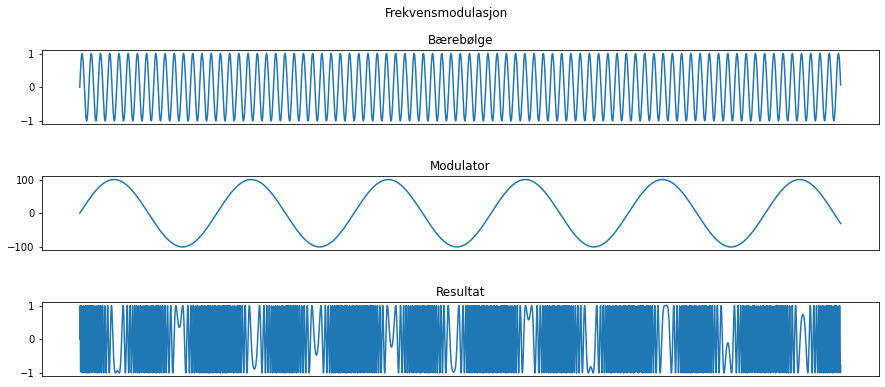

In [10]:
varighet = 4
t = linspace(0.0, varighet, int(varighet * rate))

C = 550
D = 100
M = 37

frekvensmodulasjon = sin(2*pi*C*t + D*sin(2*pi*M*t))

spill_av(frekvensmodulasjon)



# ---------------------------------------------
vis_antall_sekunder = 0.15
antall_samples = int(rate * vis_antall_sekunder)
carrierwave = sin(2 * pi * C * t)
modulatorwave = D*sin(2*pi*M*t)
fig, axs = subplots(3)
fig.suptitle("Frekvensmodulasjon")
fig.set_figwidth(15)
fig.set_figheight(6)
subplots_adjust(hspace=0.7)
x = arange(0, antall_samples)
axs[0].set_title("Bærebølge")
axs[1].set_title("Modulator")
axs[2].set_title("Resultat")
axs[0].plot(x, carrierwave[0:antall_samples])
axs[1].plot(x, modulatorwave[0:antall_samples])
axs[2].plot(x, frekvensmodulasjon[0:antall_samples])
[g.xaxis.set_visible(False) for g in axs]
show()

## Bølgeform av matematisk rekke

Sjekk ut grafen under cellen

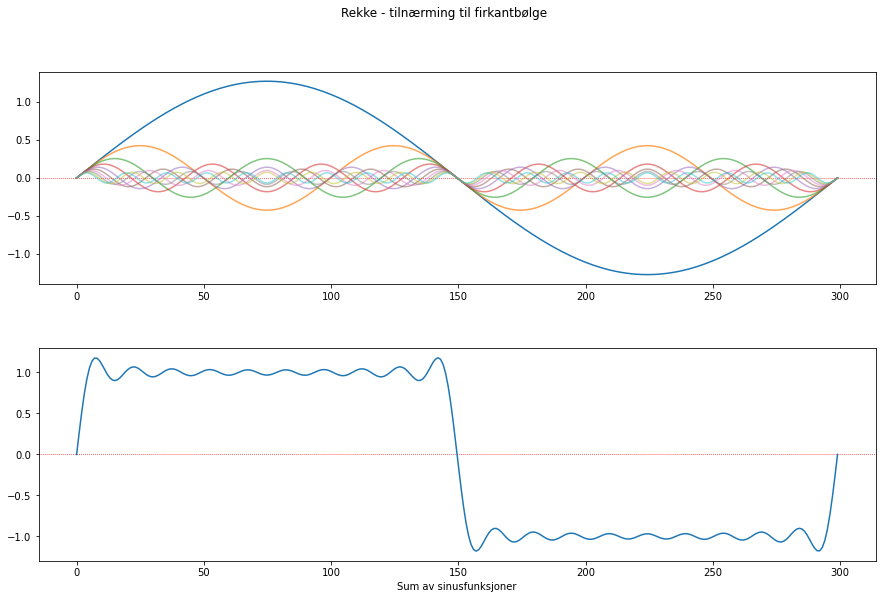

In [11]:
redusert_rate = 300
frekvens = 1
amplitude = 1
K = 10
varighet = 1

def ledd_firkant(k, frekvens, varighet):
    # funksjonsnavnet 'ledd' kommer av at vi skal bruke outputen som ledd i en rekke
    t = linspace(0., varighet, int(varighet * redusert_rate))
    return 4/pi * (sin(2 * pi * (2*k - 1) * frekvens * t) / (2*k - 1))    

def beregn_sum_firkant(K, frekvens, varighet, amplitude):
    rekke = zeros(int(varighet * redusert_rate))
    for k in range(1, K+1):
        rekke += ledd_firkant(k, frekvens, varighet) * amplitude
    return rekke



# ------------------------------------------------------------
# Kode for å plotte grafen:
def plott_sum_firkant(K):
    rekke = beregn_sum_firkant(K, frekvens, varighet, amplitude)
    axs[1].axline((0,0), (1,0), linewidth=0.75, color='r', linestyle=":")
    x = arange(0, antall_samples)
    plot(x, rekke[0:antall_samples])

antall_samples = int(varighet * redusert_rate)

fig, axs = subplots(2)
fig.suptitle("Rekke - tilnærming til firkantbølge")
axs[1].set_xlabel("Sum av sinusfunksjoner")
fig.set_figwidth(15)
fig.set_figheight(9)
subplots_adjust(hspace=0.3)
axs[0].axline((0,0), (1,0), linewidth=0.75, color='r', linestyle=":")
for k in range(1, K+1):
    transparency = 0.4 + (0.6 / k)   # Alpha fra 0.4-1.0
    axs[0].plot(ledd_firkant(k, frekvens, varighet),alpha=transparency)
plott_sum_firkant(K)
show()